<center> <img src = https://raw.githubusercontent.com/AndreyRysistov/DatasetsForPandas/main/hh%20label.jpg alt="drawing" style="width:400px;">

# <center> Проект: Анализ резюме из HeadHunter
   

In [187]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# Исследование структуры данных

1. Прочитайте данные с помощью библиотеки Pandas. Совет: перед чтением обратите внимание на разделитель внутри файла. 

In [188]:
df = pd.read_csv('hh_df.csv',sep = ';')

2. Выведите несколько первых (последних) строк таблицы, чтобы убедиться в том, что ваши данные не повреждены. Ознакомьтесь с признаками и их структурой.

In [189]:
print(df.head(6),df.tail(4),sep='\n')

                                   Пол, возраст           ЗП  \
0    Мужчина ,  39 лет , родился 27 ноября 1979   29000 руб.   
1     Мужчина ,  60 лет , родился 20 марта 1959   40000 руб.   
2  Женщина ,  36 лет , родилась 12 августа 1982   20000 руб.   
3      Мужчина ,  38 лет , родился 25 июня 1980  100000 руб.   
4     Женщина ,  26 лет , родилась 3 марта 1993  140000 руб.   
5    Мужчина ,  29 лет , родился 5 октября 1989   25000 руб.   

                           Ищет работу на должность:  \
0                            Системный администратор   
1                               Технический писатель   
2                                           Оператор   
3  Веб-разработчик (HTML / CSS / JS / PHP / базы ...   
4                  Региональный менеджер по продажам   
5                             Технический специалист   

                        Город, переезд, командировки  \
0  Советск (Калининградская область) , не готов к...   
1  Королев , не готов к переезду , готов к ред

3. Выведите основную информацию о числе непустых значений в столбцах и их типах в таблице.

4. Обратите внимание на информацию о числе непустых значений.

In [190]:
print(df.info()) # задание 2.3, 2.4
print(df.shape) # Задание 2.1
print(df['Опыт работы'].value_counts().count()) # Задание 2.5

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44744 entries, 0 to 44743
Data columns (total 12 columns):
 #   Column                           Non-Null Count  Dtype 
---  ------                           --------------  ----- 
 0   Пол, возраст                     44744 non-null  object
 1   ЗП                               44744 non-null  object
 2   Ищет работу на должность:        44744 non-null  object
 3   Город, переезд, командировки     44744 non-null  object
 4   Занятость                        44744 non-null  object
 5   График                           44744 non-null  object
 6   Опыт работы                      44576 non-null  object
 7   Последнее/нынешнее место работы  44743 non-null  object
 8   Последняя/нынешняя должность     44742 non-null  object
 9   Образование и ВУЗ                44744 non-null  object
 10  Обновление резюме                44744 non-null  object
 11  Авто                             44744 non-null  object
dtypes: object(12)
memory usage: 4.1+

5. Выведите основную статистическую информацию о столбцах.


In [191]:
df.describe() # Задание 2.5

,"Пол, возраст",ЗП,Ищет работу на должность:,"Город, переезд, командировки",Занятость,График,Опыт работы,Последнее/нынешнее место работы,Последняя/нынешняя должность,Образование и ВУЗ,Обновление резюме,Авто
count,44744,44744,44744,44744,44744,44744,44576,44743,44742,44744,44744,44744
unique,16003,690,14929,10063,38,47,44413,30214,16927,40148,18838,2
top,"Мужчина , 32 года , родился 17 сентября 1986",50000 руб.,Системный администратор,"Москва , не готов к переезду , не готов к кома...",полная занятость,полный день,Опыт работы 10 лет 8 месяцев Апрель 2018 — по...,Индивидуальное предпринимательство / частная п...,Системный администратор,Высшее образование 1987 Военный инженерный Кра...,07.05.2019 09:50,Не указано
freq,18,4064,3099,1261,30026,22727,3,935,2062,4,25,32268


# Преобразование данных

1. Начнем с простого - с признака **"Образование и ВУЗ"**. Его текущий формат это: **<Уровень образования год выпуска ВУЗ специальность...>**. Например:
* Высшее образование 2016 Московский авиационный институт (национальный исследовательский университет)...
* Неоконченное высшее образование 2000  Балтийская государственная академия рыбопромыслового флота…
Нас будет интересовать только уровень образования.

Создайте с помощью функции-преобразования новый признак **"Образование"**, который должен иметь 4 категории: "высшее", "неоконченное высшее", "среднее специальное" и "среднее".

Выполните преобразование, ответьте на контрольные вопросы и удалите признак "Образование и ВУЗ".

Совет: обратите внимание на структуру текста в столбце **"Образование и ВУЗ"**. Гарантируется, что текущий уровень образования соискателя всегда находится в первых 2ух слов и начинается с заглавной буквы. Воспользуйтесь этим.

*Совет: проверяйте полученные категории, например, с помощью метода unique()*


In [192]:
def get_education(string):
    word1, word2, tail = string.split(maxsplit = 2)
    if word1 == 'Высшее':
        return 'высшее'
    elif word1 == 'Неоконченное':
        return 'неоконченное высшее'
    elif word1 == 'Среднее' and word2 == 'специальное':
        return 'среднее специальное'
    elif word1 == 'Среднее':
        return 'среднее'
    else:
        return pd.NA
        
df['Образование'] = df['Образование и ВУЗ'].agg(get_education)
df.drop(columns='Образование и ВУЗ', inplace = True)

C:\Users\User\AppData\Local\Temp\ipykernel_1388\2999672429.py:14: FutureWarning:

using <function get_education at 0x0000015D47206E80> in Series.agg cannot aggregate and has been deprecated. Use Series.transform to keep behavior unchanged.



In [193]:
print(f"Средний уровень образования имеет {df['Образование'].value_counts().loc['среднее']} соискателей") # Задание 3.1
df['Образование'].value_counts()

Средний уровень образования имеет 559 соискателей


Образование
высшее                 33863
среднее специальное     5765
неоконченное высшее     4557
среднее                  559
Name: count, dtype: int64

2. Теперь нас интересует столбец **"Пол, возраст"**. Сейчас он представлен в формате **<Пол , возраст , дата рождения >**. Например:
* Мужчина , 39 лет , родился 27 ноября 1979 
* Женщина , 21 год , родилась 13 января 2000
Как вы понимаете, нам необходимо выделить каждый параметр в отдельный столбец.

Создайте два новых признака **"Пол"** и **"Возраст"**. При этом важно учесть:
* Признак пола должен иметь 2 уникальных строковых значения: 'М' - мужчина, 'Ж' - женщина. 
* Признак возраста должен быть представлен целыми числами.

Выполните преобразование, ответьте на контрольные вопросы и удалите признак **"Пол, возраст"** из таблицы.

*Совет: обратите внимание на структуру текста в столбце, в части на то, как разделены параметры пола, возраста и даты рождения между собой - символом ' , '. 
Гарантируется, что структура одинакова для всех строк в таблице. Вы можете воспользоваться этим.*


In [194]:
df['Пол, возраст'].head(10)

0      Мужчина ,  39 лет , родился 27 ноября 1979
1       Мужчина ,  60 лет , родился 20 марта 1959
2    Женщина ,  36 лет , родилась 12 августа 1982
3        Мужчина ,  38 лет , родился 25 июня 1980
4       Женщина ,  26 лет , родилась 3 марта 1993
5      Мужчина ,  29 лет , родился 5 октября 1989
6    Мужчина ,  46 лет , родился 19 сентября 1972
7         Мужчина ,  29 лет , родился 9 июля 1989
8        Мужчина ,  29 лет , родился 11 июля 1989
9        Мужчина ,  34 года , родился 26 мая 1984
Name: Пол, возраст, dtype: object

In [195]:
def get_gender(string):
    gender, tail = string.split(sep=',', maxsplit=1)
    if gender == 'Мужчина ':
        gender = 'М'
    else:
        gender = 'Ж'
    return gender

df['Пол'] = df['Пол, возраст'].apply(get_gender)

def get_age(string):
    head, age, tail = string.split(sep=',', maxsplit=2)
    age = int(age.split()[0])
    return age

df['Возраст'] = df['Пол, возраст'].apply(get_age)
df.drop(columns='Пол, возраст', inplace = True)

In [196]:
df.head(3)

,ЗП,Ищет работу на должность:,"Город, переезд, командировки",Занятость,График,Опыт работы,Последнее/нынешнее место работы,Последняя/нынешняя должность,Обновление резюме,Авто,Образование,Пол,Возраст
0,29000 руб.,Системный администратор,"Советск (Калининградская область) , не готов к...","частичная занятость, проектная работа, полная ...","гибкий график, полный день, сменный график, ва...",Опыт работы 16 лет 10 месяцев Август 2010 — п...,"МАОУ ""СОШ № 1 г.Немана""",Системный администратор,16.04.2019 15:59,Имеется собственный автомобиль,неоконченное высшее,М,39
1,40000 руб.,Технический писатель,"Королев , не готов к переезду , готов к редким...","частичная занятость, проектная работа, полная ...","гибкий график, полный день, сменный график, уд...",Опыт работы 19 лет 5 месяцев Январь 2000 — по...,Временный трудовой коллектив,"Менеджер проекта, Аналитик, Технический писатель",12.04.2019 08:42,Не указано,высшее,М,60
2,20000 руб.,Оператор,"Тверь , не готова к переезду , не готова к ком...",полная занятость,полный день,Опыт работы 10 лет 3 месяца Октябрь 2004 — Де...,ПАО Сбербанк,Кассир-операционист,16.04.2019 08:35,Не указано,среднее специальное,Ж,36


In [197]:
#Задание 3.2
print(f"Среди соискателей представленно {round(df['Пол'].value_counts(normalize=True).loc['Ж']*100, 2)}% резюме женщин")
print(f"Средний возраст соискателей составляет {round(df['Возраст'].mean(), 2)} года")

Среди соискателей представленно 19.07% резюме женщин
Средний возраст соискателей составляет 32.2 года


3. Следующим этапом преобразуем признак **"Опыт работы"**. Его текущий формат - это: **<Опыт работы: n лет m месяцев, периоды работы в различных компаниях…>**. 

Из столбца нам необходимо выделить общий опыт работы соискателя в месяцах, новый признак назовем "Опыт работы (месяц)"

Для начала обсудим условия решения задачи:
* Во-первых, в данном признаке есть пропуски. Условимся, что если мы встречаем пропуск, оставляем его как есть (функция-преобразование возвращает NaN)
* Во-вторых, в данном признаке есть скрытые пропуски. Для некоторых соискателей в столбце стоит значения "Не указано". Их тоже обозначим как NaN (функция-преобразование возвращает NaN)
* В-третьих, нас не интересует информация, которая описывается после указания опыта работы (периоды работы в различных компаниях)
* В-четвертых, у нас есть проблема: опыт работы может быть представлен только в годах или только месяцах. Например, можно встретить следующие варианты:
    * Опыт работы 3 года 2 месяца…
    * Опыт работы 4 года…
    * Опыт работы 11 месяцев…
    * Учитывайте эту особенность в вашем коде

Учитывайте эту особенность в вашем коде

В результате преобразования у вас должен получиться столбец, содержащий информацию о том, сколько месяцев проработал соискатель.
Выполните преобразование, ответьте на контрольные вопросы и удалите столбец **"Опыт работы"** из таблицы.


In [198]:
df['Опыт работы'].head(5)

0    Опыт работы 16 лет 10 месяцев  Август 2010 — п...
1    Опыт работы 19 лет 5 месяцев  Январь 2000 — по...
2    Опыт работы 10 лет 3 месяца  Октябрь 2004 — Де...
3    Опыт работы 18 лет 9 месяцев  Август 2017 — Ап...
4    Опыт работы 5 лет 7 месяцев  Региональный мене...
Name: Опыт работы, dtype: object

In [199]:
def get_experience(arg):
    if pd.isna(arg) or arg == 'Не указано':
        return pd.NA
    else:
        data = list(arg.split(maxsplit=6))
        years = 0 
        months = 0 
        if data[3] in ['год', 'года', 'лет']:
            years = int(data[2])
        elif data[3] in ['месяц', 'месяцев', 'месяца']:
            months = int(data[2])
        if data[5] in ['месяц', 'месяцев', 'месяца']:
            months = int(data[4])
        return years*12 + months
df['Опыт работы (месяц)'] = df['Опыт работы'].apply(get_experience)
df.drop(columns='Опыт работы', inplace=True)
df['Опыт работы (месяц)'].head(3)

0    202
1    233
2    123
Name: Опыт работы (месяц), dtype: object

In [200]:
# Задание 3.3
print(f"Медианный опыт работы составляет {df['Опыт работы (месяц)'].median()} месяцев")

Медианный опыт работы составляет 100.0 месяцев


In [201]:
# Заменяем пустые значения на 0 и приоразуем тип из обьекта в флоат.
df['Опыт работы (месяц)'] = df['Опыт работы (месяц)'].fillna(0)
df['Опыт работы (месяц)'] = df['Опыт работы (месяц)'].astype('float')

4. Хорошо идем! Следующий на очереди признак "Город, переезд, командировки". Информация в нем представлена в следующем виде: **<Город , (метро) , готовность к переезду (города для переезда) , готовность к командировкам>**. В скобках указаны необязательные параметры строки. Например, можно встретить следующие варианты:

* Москва , не готов к переезду , готов к командировкам
* Москва , м. Беломорская , не готов к переезду, не готов к командировкам
* Воронеж , готов к переезду (Сочи, Москва, Санкт-Петербург) , готов к командировкам

Создадим отдельные признаки **"Город"**, **"Готовность к переезду"**, **"Готовность к командировкам"**. При этом важно учесть:

* Признак **"Город"** должен содержать только 4 категории: "Москва", "Санкт-Петербург" и "город-миллионник" (их список ниже), остальные обозначьте как "другие".

    Список городов-миллионников:
    
   <code>million_cities = ['Новосибирск', 'Екатеринбург','Нижний Новгород','Казань', 'Челябинск','Омск', 'Самара', 'Ростов-на-Дону', 'Уфа', 'Красноярск', 'Пермь', 'Воронеж','Волгоград']
    </code>
    Инфорация о метро, рядом с которым проживает соискатель нас не интересует.
* Признак **"Готовность к переезду"** должен иметь два возможных варианта: True или False. Обратите внимание, что возможны несколько вариантов описания готовности к переезду в признаке "Город, переезд, командировки". Например:
    * … , готов к переезду , …
    * … , не готова к переезду , …
    * … , готова к переезду (Москва, Санкт-Петербург, Ростов-на-Дону)
    * … , хочу переехать (США) , …
    
    Нас интересует только сам факт возможности или желания переезда.
* Признак **"Готовность к командировкам"** должен иметь два возможных варианта: True или False. Обратите внимание, что возможны несколько вариантов описания готовности к командировкам в признаке "Город, переезд, командировки". Например:
    * … , готов к командировкам , … 
    * … , готова к редким командировкам , …
    * … , не готов к командировкам , …
    
    Нас интересует только сам факт готовности к командировке.
    
    Еще один важный факт: при выгрузки данных у некоторых соискателей "потерялась" информация о готовности к командировкам. Давайте по умолчанию будем считать, что такие соискатели не готовы к командировкам.
    
Выполните преобразования и удалите столбец **"Город, переезд, командировки"** из таблицы.

*Совет: обратите внимание на то, что структура текста может меняться в зависимости от указания ближайшего метро. Учите это, если будете использовать порядок слов в своей программе.*


In [202]:
df['Город, переезд, командировки'].head(10)

0    Советск (Калининградская область) , не готов к...
1    Королев , не готов к переезду , готов к редким...
2    Тверь , не готова к переезду , не готова к ком...
3    Саратов , не готов к переезду , готов к редким...
4    Москва , не готова к переезду , готова к коман...
5    Старый Оскол , не готов к переезду , не готов ...
6    Москва , не готов к переезду , готов к редким ...
7    Москва ,  м. Бульвар Рокоссовского , готов к п...
8    Москва ,  м. Шоссе Энтузиастов , готов к перее...
9    Москва ,  м. Теплый Стан , не готов к переезду...
Name: Город, переезд, командировки, dtype: object

In [203]:
# Функция извлечения города
def get_city(string):
    city = list(string.split(sep=','))[0]
    city = city.rstrip()
    million_cities = ['Новосибирск', 'Екатеринбург','Нижний Новгород','Казань', 'Челябинск','Омск', 'Самара', 'Ростов-на-Дону', 'Уфа', 'Красноярск', 'Пермь', 'Воронеж','Волгоград']
    if city == 'Москва':
        return 'Москва'
    elif city == 'Санкт-Петербург':
        return 'Санкт-Петербург'
    elif city in million_cities:
        return 'город-миллионник'
    else:
        return 'другие'
df['Город']=df['Город, переезд, командировки'].apply([get_city])

# Фунскция для оценки готовности к переезду
def get_mobility(string):
    data = list(string.split(sep=','))
    for i in data:
        if 'переезд' in i or 'переех' in i :
            if ('готов' in i or 'хочу' in i) and 'не готов' not in i:
                return True
            else:
                return False
df['Готовность к переездам']= df['Город, переезд, командировки'].apply([get_mobility])

# функция для оценки готовности к командировкам 
def get_trip_raedy(string):
    if ('не готов к командировкам' in string) or ('не готова к командировкам' in string):
        return False
    else: 
        return True
df['Готовность к командировкам']= df['Город, переезд, командировки'].apply([get_trip_raedy])
df.drop(columns='Город, переезд, командировки', inplace=True)

In [204]:
#задание 3.4
print(f"Среди соискателей в Санкт-Петербурге живут {round(df['Город'].value_counts(normalize=True).loc['Санкт-Петербург']*100)}%")
mask1= df['Готовность к переездам'] & df['Готовность к командировкам']
print(f'Доля соискателей готовых одновременно и к переездам, и к командировкам равна {round(df[mask1].count()[1]/df.shape[0]*100)}%')

Среди соискателей в Санкт-Петербурге живут 11%
Доля соискателей готовых одновременно и к переездам, и к командировкам равна 32%


C:\Users\User\AppData\Local\Temp\ipykernel_1388\4070586592.py:4: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



5. Рассмотрим поближе признаки **"Занятость"** и **"График"**. Сейчас признаки представляют собой набор категорий желаемой занятости (полная занятость, частичная занятость, проектная работа, волонтерство, стажировка) и желаемого графика работы (полный день, сменный график, гибкий график, удаленная работа, вахтовый метод).
На сайте hh.ru соискатель может указывать различные комбинации данных категорий, например:
* полная занятость, частичная занятость
* частичная занятость, проектная работа, волонтерство
* полный день, удаленная работа
* вахтовый метод, гибкий график, удаленная работа, полная занятость

Такой вариант признаков имеет множество различных комбинаций, а значит множество уникальных значений, что мешает анализу. Нужно это исправить!

Давайте создадим признаки-мигалки для каждой категории: если категория присутствует в списке желаемых соискателем, то в столбце на месте строки рассматриваемого соискателя ставится True, иначе - False.

Такой метод преобразования категориальных признаков называется One Hot Encoding и его схема представлена на рисунке ниже:
<img src=https://raw.githubusercontent.com/AndreyRysistov/DatasetsForPandas/main/ohe.jpg>
Выполните данное преобразование для признаков "Занятость" и "График", ответьте на контрольные вопросы, после чего удалите их из таблицы

In [205]:
df[['Занятость', 'График']].head()

,Занятость,График
0,"частичная занятость, проектная работа, полная ...","гибкий график, полный день, сменный график, ва..."
1,"частичная занятость, проектная работа, полная ...","гибкий график, полный день, сменный график, уд..."
2,полная занятость,полный день
3,"частичная занятость, проектная работа, полная ...","гибкий график, удаленная работа"
4,полная занятость,полный день


In [206]:
employment = ['полная занятость', 'частичная занятость', 'проектная работа', 'волонтерство', 'стажировка']
for i in employment:
    df[i] = df['Занятость'].apply(lambda x: True if i in x else False) # для цифровых значений лучше заменить True и False на 1 и 0, но в задание написано True, False.

shedule = ['полный день', 'сменный график', 'гибкий график', 'удаленная работа', 'вахтовый метод']
for n in shedule:
    df[n] = df['График'].apply(lambda x: True if n in x else False)
df.drop(columns=['Занятость', 'График'], inplace=True)
df.head(3)

,ЗП,Ищет работу на должность:,Последнее/нынешнее место работы,Последняя/нынешняя должность,Обновление резюме,Авто,Образование,Пол,Возраст,Опыт работы (месяц),...,полная занятость,частичная занятость,проектная работа,волонтерство,стажировка,полный день,сменный график,гибкий график,удаленная работа,вахтовый метод
0,29000 руб.,Системный администратор,"МАОУ ""СОШ № 1 г.Немана""",Системный администратор,16.04.2019 15:59,Имеется собственный автомобиль,неоконченное высшее,М,39,202.0,...,True,True,True,False,False,True,True,True,True,True
1,40000 руб.,Технический писатель,Временный трудовой коллектив,"Менеджер проекта, Аналитик, Технический писатель",12.04.2019 08:42,Не указано,высшее,М,60,233.0,...,True,True,True,False,False,True,True,True,True,False
2,20000 руб.,Оператор,ПАО Сбербанк,Кассир-операционист,16.04.2019 08:35,Не указано,среднее специальное,Ж,36,123.0,...,True,False,False,False,False,True,False,False,False,False


In [207]:
# Задание 3.5
print(f"Среди соискателей проектную работу или волонтество ищут {df[df['проектная работа'] & df['волонтерство']].shape[0]} человек")
print(f"Среди соискателей хотят работать вахтовым методом или с гибким графиком {df[df['вахтовый метод'] & df['гибкий график']].shape[0]} человек")

Среди соискателей проектную работу или волонтество ищут 436 человек
Среди соискателей хотят работать вахтовым методом или с гибким графиком 2311 человек


6. (2 балла) Наконец, мы добрались до самого главного и самого важного - признака заработной платы **"ЗП"**. 
В чем наша беда? В том, что помимо желаемой заработной платы соискатель указывает валюту, в которой он бы хотел ее получать, например:
* 30000 руб.
* 50000 грн.
* 550 USD

Нам бы хотелось видеть заработную плату в единой валюте, например, в рублях. Возникает вопрос, а где взять курс валют по отношению к рублю?

На самом деле язык Python имеет в арсенале огромное количество возможностей получения данной информации, от обращения к API Центробанка, до использования специальных библиотек, например pycbrf. Однако, это не тема нашего проекта.

Поэтому мы пойдем в лоб: обратимся к специальным интернет-ресурсам для получения данных о курсе в виде текстовых файлов. Например, MDF.RU, данный ресурс позволяет удобно экспортировать данные о курсах различных валют и акций за указанные периоды в виде csv файлов. Мы уже сделали выгрузку курсов валют, которые встречаются в наших данных за период с 29.12.2017 по 05.12.2019. Скачать ее вы можете **на платформе**

Создайте новый DataFrame из полученного файла. В полученной таблице нас будут интересовать столбцы:
* "currency" - наименование валюты в ISO кодировке,
* "date" - дата, 
* "proportion" - пропорция, 
* "close" - цена закрытия (последний зафиксированный курс валюты на указанный день).


Перед вами таблица соответствия наименований иностранных валют в наших данных и их общепринятых сокращений, которые представлены в нашем файле с курсами валют. Пропорция - это число, за сколько единиц валюты указан курс в таблице с курсами. Например, для казахстанского тенге курс на 20.08.2019 составляет 17.197 руб. за 100 тенге, тогда итоговый курс равен - 17.197 / 100 = 0.17197 руб за 1 тенге.
Воспользуйтесь этой информацией в ваших преобразованиях.

<img src=https://raw.githubusercontent.com/AndreyRysistov/DatasetsForPandas/main/table.jpg>


Осталось только понять, откуда брать дату, по которой определяется курс? А вот же она - в признаке **"Обновление резюме"**, в нем содержится дата и время, когда соискатель выложил текущий вариант своего резюме. Нас интересует только дата, по ней бы и будем сопоставлять курсы валют.

Теперь у нас есть вся необходимая информация для того, чтобы создать признак "ЗП (руб)" - заработная плата в рублях.

После ответа на контрольные вопросы удалите исходный столбец заработной платы "ЗП" и все промежуточные столбцы, если вы их создавали.

Итак, давайте обсудим возможный алгоритм преобразования: 
1. Перевести признак "Обновление резюме" из таблицы с резюме в формат datetime и достать из него дату. В тот же формат привести признак "date" из таблицы с валютами.
2. Выделить из столбца "ЗП" сумму желаемой заработной платы и наименование валюты, в которой она исчисляется. Наименование валюты перевести в стандарт ISO согласно с таблицей выше.
3. Присоединить к таблице с резюме таблицу с курсами по столбцам с датой и названием валюты (подумайте, какой тип объединения надо выбрать, чтобы в таблице с резюме сохранились данные о заработной плате, изначально представленной в рублях). Значение close для рубля заполнить единицей 1 (курс рубля самого к себе)
4. Умножить сумму желаемой заработной платы на присоединенный курс валюты (close) и разделить на пропорцию (обратите внимание на пропуски после объединения в этих столбцах), результат занести в новый столбец "ЗП (руб)".


In [208]:
# Создание нового DataFrame валюты
convector = pd.read_csv('ExchangeRates.csv', sep=',')
convector['date'] = pd.to_datetime(convector['date'])

df['Обновление резюме'] = df['Обновление резюме'].apply(lambda x: x.split()[0])
df['Обновление резюме'] = pd.to_datetime(df['Обновление резюме'])

df['Сумма'] = df['ЗП'].apply(lambda x: x.split()[0]).astype(float)
df['Валюта'] = df['ЗП'].apply(lambda x: x.split()[1])

def rename_curryncy(str):
    if str == 'бел.руб':
        return 'BYN'
    elif str == 'грн.':
        return 'UAH'
    elif str == 'сум':
        return 'UZS'
    else:
        return str
df['Валюта'] = df['Валюта'].apply(rename_curryncy)

df=df.merge(
    convector,
    how = 'left',
    left_on=['Обновление резюме', 'Валюта'],
    right_on=['date', 'currency']    
)

mask1 = df['Валюта'] == 'руб.'
df.loc[mask1, 'close'] = 1.0
df.loc[mask1, 'proportion'] = 1.0

df['ЗП (руб)'] = df['Сумма'] * df['close'] / df['proportion']
# Удалим ненужные признаки
df.drop(columns=['ЗП', 'Сумма', 'Валюта', 'currency', 'per', 'date', 'time', 'close', 'vol',
       'proportion'], inplace=True)


C:\Users\User\AppData\Local\Temp\ipykernel_1388\3625146761.py:3: UserWarning:

Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.

C:\Users\User\AppData\Local\Temp\ipykernel_1388\3625146761.py:6: UserWarning:

Parsing dates in %d.%m.%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.



In [209]:
# Задание 3.6
print(f"Медианная заработная плата соискателей в нашей таблице составляет {round(df['ЗП (руб)'].median()/1000)} тысяч рублей")
# в задании почему то получилось 59, но по факту 60

Медианная заработная плата соискателей в нашей таблице составляет 60 тысяч рублей


# Исследование зависимостей в данных

1. Постройте распределение признака **"Возраст"**. Опишите распределение, отвечая на следующие вопросы: чему равна мода распределения, каковы предельные значения признака, в каком примерном интервале находится возраст большинства соискателей? Есть ли аномалии для признака возраста, какие значения вы бы причислили к их числу?
*Совет: постройте гистограмму и коробчатую диаграмму рядом.*

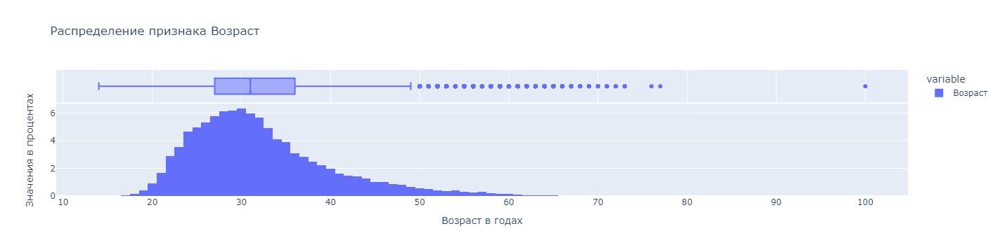

In [210]:
fig = px.histogram(
    df['Возраст'],
    title='Распределение признака Возраст',
    histnorm='percent',
    marginal='box'
)
fig.update_layout(xaxis_title="Возраст в годах", yaxis_title="Значения в процентах")
fig.show()

Распределение близко к нормальному с ассиметрией вправо.

Возраст большинства соискателей находится в интервале от 21 до 46 лет. Межквартильный диапазон составляет от 21 до 46 лет. Минимальное и максимальное значения - 14 и 100 лет

Мода распределения = 30 лет

Возраст большинства соискателей находится в диапазоне от 27 до 36 лет, согласно коробчатому графику

Следует детальнее рассмотреть значение 100 лет, так как оно является слишком большим, а до него ближайший возраст - 77 лет. Возможно это значение будет аномалией

2. Постройте распределение признака **"Опыт работы (месяц)"**. Опишите данное распределение, отвечая на следующие вопросы: чему равна мода распределения, каковы предельные значения признака, в каком примерном интервале находится опыт работы большинства соискателей? Есть ли аномалии для признака опыта работы, какие значения вы бы причислили к их числу?
*Совет: постройте гистограмму и коробчатую диаграмму рядом.*

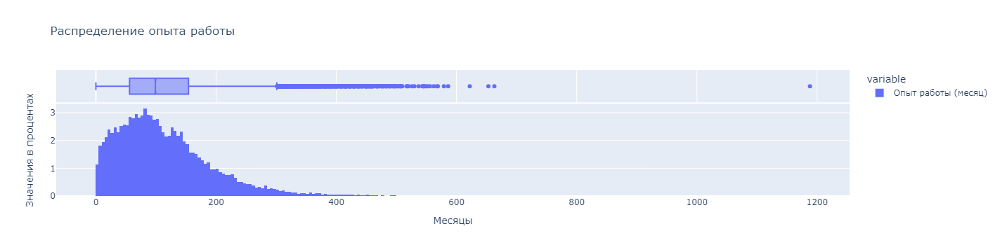

In [211]:
fig = px.histogram(
   df['Опыт работы (месяц)'],
    title='Распределение опыта работы',
    histnorm='percent',
    marginal='box'
)
fig.update_layout(xaxis_title="Месяцы", yaxis_title="Значения в процентах")
fig.show()

Распределение близко к нормальному с ассиметрией вправо.

Модальное значение = 80-84

Минимальное и максимальное значения - 1 и 1188 месяцев

Опыт большинства соискателей находится в диапазоне от 1 до 300 месяцев.

Межквартильный диапазон составляет от 57 до 154 месяцев.

На распределении наблюдается явная аномалия 1188 месяцев = 99 годам, даже учитывая, что самому пожилому соискателю 100 лет.

3. Постройте распределение признака **"ЗП (руб)"**. Опишите данное распределение, отвечая на следующие вопросы: каковы предельные значения признака, в каком примерном интервале находится заработная плата большинства соискателей? Есть ли аномалии для признака возраста? Обратите внимание на гигантские размеры желаемой заработной платы.
*Совет: постройте гистограмму и коробчатую диаграмму рядом.*


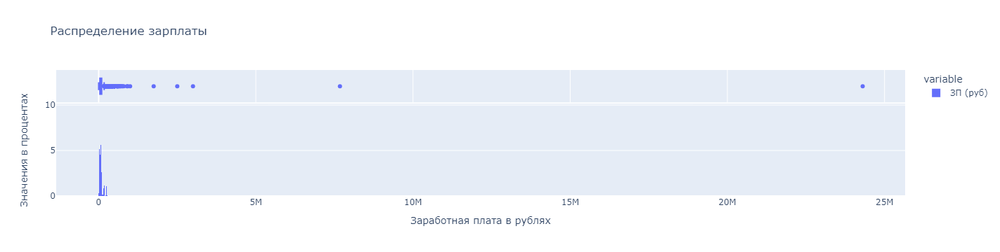

In [212]:
fig = px.histogram(
    df['ЗП (руб)'],
    title='Распределение зарплаты',
    histnorm='percent',
    marginal='box'
)
fig.update_layout(xaxis_title="Заработная плата в рублях", yaxis_title="Значения в процентах")
fig.show()

На гистограмме наблюдаются многочисленные выбросы.

Мода распределения составляет 50 тысяч рублей.

Минимальное и максимальное значения желаемой заработной платы - 1 рубль и 24,3 миллиона рублей

У большинства соискателей ЗП находится в диапазоне от 2,5 до 150 тысяч рублей, межквартильный интервал составляет 37 - 95 тысяч рублей.

Аномальным значением является желаемая ЗП в 24 миллиона рублей. Вероятно, пользователь указал ошибочную валюту или не учёл знаки после запятой. Также он мог подразумевать зарплату за год, а не за месяц.

Также на диаграмме можно наблюдать ещё пять значений от миллиона и выше. Аналогично можно предположить, что соискатели указывали зарплату за год или в других валютах. Но в этом случае нельзя исключать, что они действительно устанавливают такой уровень желаемой ЗП.

4. Постройте диаграмму, которая показывает зависимость **медианной** желаемой заработной платы (**"ЗП (руб)"**) от уровня образования (**"Образование"**). Используйте для диаграммы данные о резюме, где желаемая заработная плата меньше 1 млн рублей.
*Сделайте выводы по представленной диаграмме: для каких уровней образования наблюдаются наибольшие и наименьшие уровни желаемой заработной платы? Как вы считаете, важен ли признак уровня образования при прогнозировании заработной платы?*

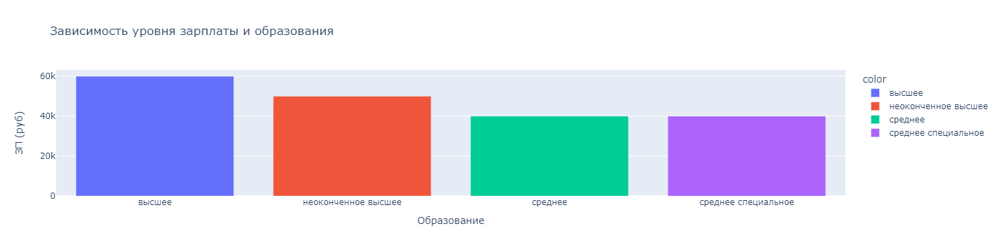

In [213]:
mask = df['ЗП (руб)'] < 1000000
data = df[mask].groupby('Образование')['ЗП (руб)'].median()
fig = px.bar(
    data,
    y = 'ЗП (руб)',
    color=['высшее', 'неоконченное высшее', 'среднее', 'среднее специальное'],
    title='Зависимость уровня зарплаты и образования'
)

fig.show()

На диаграмме видно, что при наличии высшего образования уровень желаемой зарплаты выше, чем у других. Можно проследить тенденцияю: чем выше уровень образования, тем выше желаемая ЗП.

Уровень образования несомненно важен при прогнозировании заработной платы. Так как разница в уровне зарплат может достигать 20% в зависимости от образования.

5. Постройте диаграмму, которая показывает распределение желаемой заработной платы (**"ЗП (руб)"**) в зависимости от города (**"Город"**). Используйте для диаграммы данные о резюме, где желая заработная плата меньше 1 млн рублей.
*Сделайте выводы по полученной диаграмме: как соотносятся медианные уровни желаемой заработной платы и их размах в городах? Как вы считаете, важен ли признак города при прогнозировании заработной платы?*

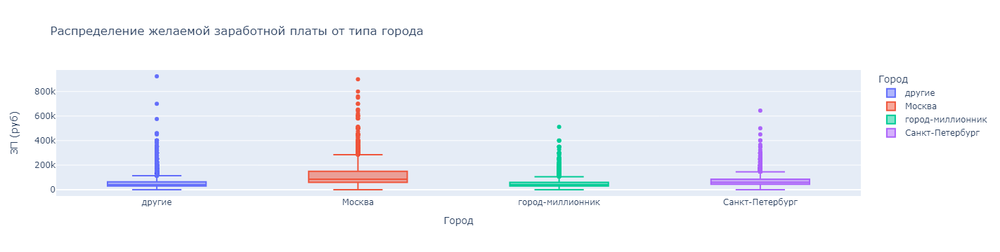

In [214]:
city = df[mask] 
fig = px.box(
    city,
    x='Город', 
    y='ЗП (руб)', 
    color='Город',
    title='Распределение желаемой заработной платы от типа города'
)
fig.show()


На построенной диаграмме можно наблюдать такую тенденцию: чем крупнее город, тем выше значение желаемой ЗП. Самая высокая медианная желаемая зарплата в Москве - 85 тысяч, затем в Санкт-Петербурге - 60 тысяч, в городах-миллиониках и остальных - 40 тысяч.

Признак города также важен при прогнозировании желаемой ЗП, так как зарплаты могут различаться на 45 тысяч в зависимости от города.

6. Постройте **многоуровневую столбчатую диаграмму**, которая показывает зависимость медианной заработной платы (**"ЗП (руб)"**) от признаков **"Готовность к переезду"** и **"Готовность к командировкам"**. Проанализируйте график, сравнив уровень заработной платы в категориях.

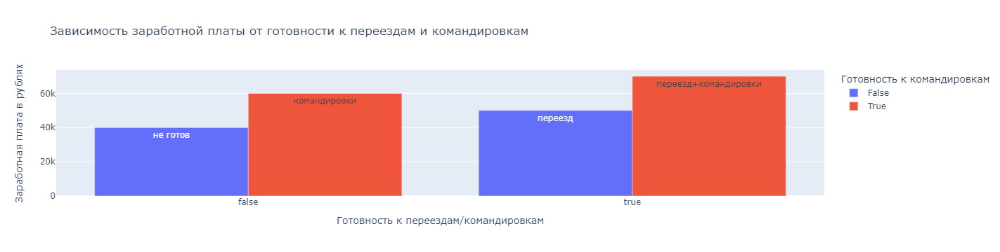

In [215]:
trip = df.groupby(
    by=['Готовность к переездам','Готовность к командировкам'], as_index=0)['ЗП (руб)'].median()

fig = px.bar(
    data_frame=trip,
    x='Готовность к переездам',
    y='ЗП (руб)',
    barmode='group',
    
    color='Готовность к командировкам',
    text=["не готов", 'командировки', 'переезд', 'переезд+командировки'],
    title="Зависимость заработной платы от готовности к переездам и командировкам"
        
)
fig.update_layout(yaxis_title="Заработная плата в рублях", xaxis_title="Готовность к переездам/командировкам")

fig.show()


По графику видно, что соискатели готовые к командировкам и переездам указывают более высокую желаемую ЗП. Также можно ответить, что при командировках указывают большую ЗП, чем при переездах. Можно предположить, что люди охотнее соглашаются на переезд, поэтому готовы получать меньше, чем периодически ездить в командировки.

7. Постройте сводную таблицу, иллюстрирующую зависимость **медианной** желаемой заработной платы от возраста (**"Возраст"**) и образования (**"Образование"**). На полученной сводной таблице постройте **тепловую карту**. Проанализируйте тепловую карту, сравнив показатели внутри групп.

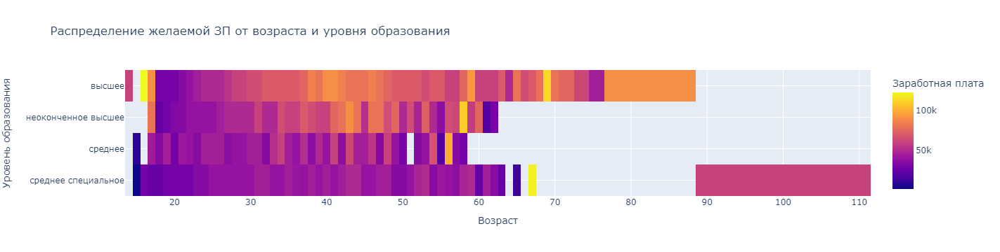

In [216]:
salary = df.groupby(by=['Образование', 'Возраст'], as_index=False)['ЗП (руб)'].median()

#сведем данные в таблицу
pivot = salary.pivot(
    index='Образование',
    columns='Возраст',
    values='ЗП (руб)'
)

fig = px.imshow(
    pivot,
    labels={'color':'Заработная плата'},
    title='Распределение желаемой ЗП от возраста и уровня образования',
    
)
fig.update_layout(yaxis_title="Уровень образования", xaxis_title="Возраст")

fig.show()

На данной тепловой карте можно наблюдать, что во всех категориях образования идёт увеличение уровня желаемой зарплаты с увеличением возраста. Соискатели с большим возрастом - то есть пенсионеры - как правило указыают низкий уровень ЗП.

Наибольшая интенсивность роста заработной платы у соискателей с высшим образованием, самая низкая интенсивность роста заработной платы у соискателей со среднеспециальным образованием.

Можно наблюдать, что соискатели с высшим образованием указывают более высокую ЗП, чем другие категории. К тому же люди с высшим образованием работают дольше - на графике больше значений по возрасту, чем в других группах.

На диаграмме наблюдается явная аномалия - высшее образование в 17 лет. Либо пользователь указал неверную дату рождения, либо неправильный уровень образования. Также есть значение в 100 лет и ЗП 60 000. Такой результат нельзя сразу исключать, но в любом случае это значение требует проверки.

8. Постройте **диаграмму рассеяния**, показывающую зависимость опыта работы (**"Опыт работы (месяц)"**) от возраста (**"Возраст"**). Опыт работы переведите из месяцев в года, чтобы признаки были в едином масштабе. Постройте на графике дополнительно прямую, проходящую через точки (0, 0) и (100, 100). Данная прямая соответствует значениям, когда опыт работы равен возрасту человека. Точки, лежащие на этой прямой и выше нее - аномалии в наших данных (опыт работы больше либо равен возрасту соискателя)

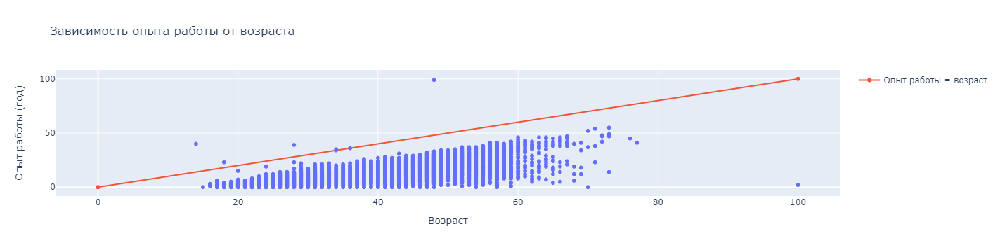

In [217]:
df['Опыт работы (год)'] = round(df['Опыт работы (месяц)']/12) # переводим месяцы в года

fig = px.scatter(
    df,
    y='Опыт работы (год)',
    x='Возраст',
    title='Зависимость опыта работы от возраста'
)
fig.add_scatter(x=[0, 100], y=[0, 100], name='Опыт работы = возраст')
fig.show()

На построенной диаграмме наблюдаются явные аномалии - 7 значений. Так как возраст соискателя не может быть равен или меньше опыта работы, как бы рано он не начал работать.

Также можно заметить точку со значением 100 лет и 2 года опыта. Такое вполне может быть, но стоит изучить этот момент.

**Дополнительные баллы**

Для получения 2 дополнительных баллов по разведывательному анализу постройте еще два любых содержательных графика или диаграммы, которые помогут проиллюстрировать влияние признаков/взаимосвязь между признаками/распределения признаков. Приведите выводы по ним. Желательно, чтобы в анализе участвовали признаки, которые мы создавали ранее в разделе "Преобразование данных".


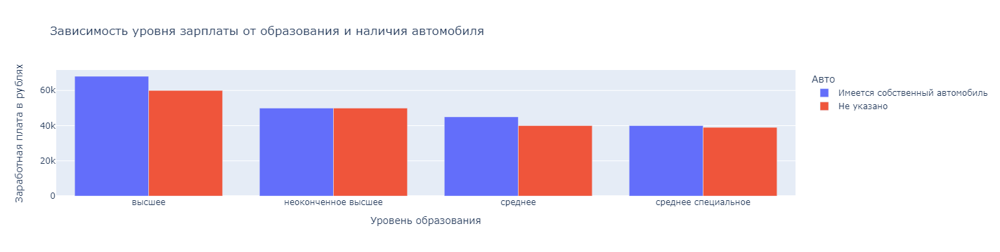

In [218]:
auto = df.groupby(by=['Образование','Авто'], as_index=0)['ЗП (руб)'].median()

fig = px.bar(
    data_frame=auto,
    x='Образование',
    y='ЗП (руб)',
    barmode='group',
    color='Авто',
    title='Зависимость уровня зарплаты от образования и наличия автомобиля'
)
fig.update_layout(yaxis_title="Заработная плата в рублях", xaxis_title="Уровень образования")

fig.show()

Как мы видим из графика, наблюдается чёткая тенденция между наличием автомобиля и уровнем ЗП - при наличии автомобиля ЗП выше.

Также можно обратить внимание, что количество людей с л/а тем больше, чем выше уровень их образования.

486 человек согласны на волонтерство, что составляет  1 %


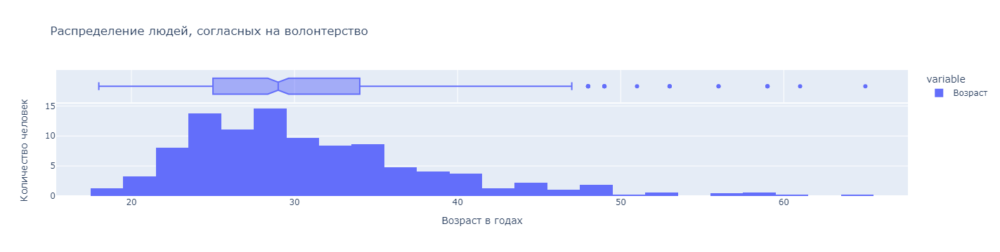

In [219]:
s = df[df['волонтерство'] == True]
print(s['Возраст'].shape[0], 'человек согласны на волонтерство, что составляет ', 
      round(s['Возраст'].shape[0]/df['Возраст'].shape[0]*100), '%')

fig = px.histogram(
    s['Возраст'],
    title='Распределение людей, согласных на волонтерство',
    histnorm='percent',
    marginal='box'
)


fig.update_layout(xaxis_title="Возраст в годах", yaxis_title="Количество человек")
fig.show()

На этой гистограмме мы можем наблюдать, сколько человек согласны на волонтерство. Всего на волонтерство согласны 486 человек, что составляет всего один процент от всего числа соискателей.

Можно проследить тенденцию, что чем старше люди, тем менее охотно они участвуют в волонтёрстве. В отличии от распределения всех соискателей у "волонтёров" ежквартильный диапазон составляет от 27 до 36 лет, что на несколько лет ниже. А максимальный возраст составляет 65 лет.

Также интересно отметить, что подростки до 18 лет не хотят участвовать в волонтёрстве. Можно предположить, что эти соискатели ещё получают школьное образование, из-за чего у них мало времени на бесплатную работу, и они ищу в основном заработок.

# Очистка данных

1. Начнем с дубликатов в наших данных. Найдите **полные дубликаты** в таблице с резюме и удалите их. 

In [220]:
duplicates = df[df.duplicated(subset=df.columns)]
df = df.drop_duplicates()
print(duplicates.shape[0], 'полных дубликатов в данных')

161 полных дубликатов в данных


2. Займемся пропусками. Выведите информацию **о числе пропусков** в столбцах. 

In [221]:
null = df.isnull().sum()
print(null['Опыт работы (месяц)'], 'пропусков в столбце «Опыт работы (месяц)»')
null[null > 0]

0 пропусков в столбце «Опыт работы (месяц)»


Последнее/нынешнее место работы      1
Последняя/нынешняя должность         2
ЗП (руб)                           329
dtype: int64

3. Итак, у нас есть пропуски в 3ех столбцах: **"Опыт работы (месяц)"**, **"Последнее/нынешнее место работы"**, **"Последняя/нынешняя должность"**. Поступим следующим образом: удалите строки, где есть пропуск в столбцах с местом работы и должностью. Пропуски в столбце с опытом работы заполните **медианным** значением.

In [222]:
df = df.dropna(axis=0, subset=['Последнее/нынешнее место работы', 'Последняя/нынешняя должность'])
df = df.fillna({'Опыт работы (месяц)' : df['Опыт работы (месяц)'].median(), 'Опыт работы (год)' : df['Опыт работы (год)'].median()})
print(round(df['Опыт работы (месяц)'].mean()), 'результирующее среднее значение в столбце «Опыт работы (месяц)» после заполнения пропусков')

114 результирующее среднее значение в столбце «Опыт работы (месяц)» после заполнения пропусков


4. Мы добрались до ликвидации выбросов. Сначала очистим данные вручную. Удалите резюме, в которых указана заработная плата либо выше 1 млн. рублей, либо ниже 1 тыс. рублей.

In [223]:
mask_s = df[(df['ЗП (руб)'] > 1e6) | (df['ЗП (руб)'] < 1e3)]
#df.drop(mask_s.index, inplace=True)
print(mask_s.shape[0], 'выбросов')

89 выбросов


5. В процессе разведывательного анализа мы обнаружили резюме, в которых **опыт работы в годах превышал возраст соискателя**. Найдите такие резюме и удалите их из данных


In [224]:
mask_ex = df[df['Возраст'] <= df['Опыт работы (год)']]
df = df.drop(mask_ex.index)
print(mask_ex.shape[0], 'выбросов')

7 выбросов


6. В результате анализа мы обнаружили потенциальные выбросы в признаке **"Возраст"**. Это оказались резюме людей чересчур преклонного возраста для поиска работы. Попробуйте построить распределение признака в **логарифмическом масштабе**. Добавьте к графику линии, отображающие **среднее и границы интервала метода трех сигм**. Напомним, сделать это можно с помощью метода axvline. Например, для построение линии среднего будет иметь вид:

`histplot.axvline(log_age.mean(), color='k', lw=2)`

В какую сторону асимметрично логарифмическое распределение? Напишите об этом в комментарии к графику.
Найдите выбросы с помощью метода z-отклонения и удалите их из данных, используйте логарифмический масштаб. Давайте сделаем послабление на **1 сигму** (возьмите 4 сигмы) в **правую сторону**.

Выведите таблицу с полученными выбросами и оцените, с каким возрастом соискатели попадают под категорию выбросов?

D:\python\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



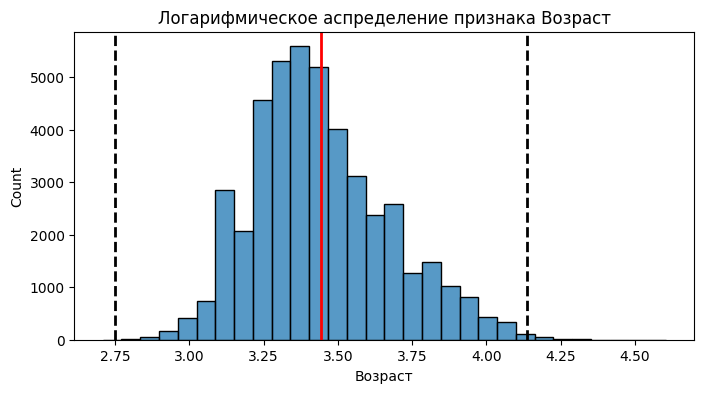

In [225]:
fig, ax = plt.subplots(1, 1, figsize=(8, 4))
log_age = np.log(df['Возраст'])# не прибавляем 0, так как у нас нет нулевых значений возраста
histplot = sns.histplot(log_age, bins=30, ax=ax)
# Построение линий
histplot.axvline(log_age.mean(), color='r', lw=2)
histplot.axvline((log_age.mean()+ 3 * log_age.std()), color='k', ls='--', lw=2) # пунктир
histplot.axvline((log_age.mean()- 3 * log_age.std()), color='k', ls='--', lw=2) # пунктир
histplot.set_title('Логарифмическое аспределение признака Возраст');

In [226]:
def outliers_z_score_mod(data, feature, log_scale=False, left=3, right=3):
    """Функция очищает данные методом z-отклонения
    Args:
        data (_type_): данные на входе
        feature (_type_): признак
        log_scale (bool, optional): нужно ли использовать логорифмический масштаб Defaults to False.
        left (int, optional): левая граница итервала. Defaults to 3.
        right (int, optional): правая граница интервала. Defaults to 3.

    Returns:
        _type_: возвращает outliers - выбросы за границей интревала, cleaned - очищенные данные
    """
    if log_scale:
        x = np.log(data[feature]) # не прибавляем 0, так как у нас нет нулевых значений возраста
    else:
        x = data[feature]
    mu = x.mean()
    sigma = x.std()
    
    lower_bound = mu - left * sigma 
    upper_bound = mu + right * sigma
    
    outliers = data[(x < lower_bound) | (x > upper_bound)]
    cleaned = data[(x > lower_bound) & (x < upper_bound)]
    return outliers, cleaned
outliers, cleaned = outliers_z_score_mod(df, 'Возраст', log_scale=1, right=4)

In [227]:
print(f'Число выбросов по методу z-отклонения: {outliers.shape[0]}')
print(f'Число оставшихся значений по методу z-отклонения: {cleaned.shape[0]}')
outliers['Возраст']

Число выбросов по методу z-отклонения: 3
Число оставшихся значений по методу z-отклонения: 44571


31137     15
32950     15
33654    100
Name: Возраст, dtype: int64

Распределение ассимитрично в правую сторону. С учётом послабления правой границы на 1 получилось три выброса - 15, 15 и 100 лет